<h1 align="center">US unemployment and participation rate data analysis from FRED, using their official API</h1> 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 500)
color_pal = plt.rcParams["axes.prop_cycle"].by_key()['color']

from fredapi import Fred

fred_key = 'f20f18f1edc1de773101dc867600360d'

#Create the Fred Object
fred = Fred(api_key = fred_key)

#Search for economic data
sp_search = fred.search('S&P', order_by = 'popularity')
#sp_search.head()

## FRED unemployment data for the 50 states

### Pulling each table straight from the FRED website, putting them into one big dataframe

In [3]:
#unemp_results = fred.search('unemployment')
#unrate = fred.get_series("UNRATE")

unemp_df = fred.search('unemployment rate state', filter = ('frequency','Monthly'))
unemp_df = unemp_df.query("seasonal_adjustment == 'Seasonally Adjusted' and units == 'Percent'")
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate' and 'in ')]
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Census|-|District|State|Puerto') == False]

all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)

unemp_states = pd.concat(all_results, axis = 1)

#Modify base data, to change the FRED state names to the actual ones
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in ', '').to_dict()
#using list comprehension
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

unemp_states = unemp_states.reindex(sorted(unemp_states.columns), axis=1)
#unemp_states.columns
#unemp_states

### Plot the unemployment rate for the 50 states on an interactive line chart (1976-2022) using Plotly

In [4]:
hist_unemp = px.line(unemp_states, title = 'Unemployment rate by State (in % of the labour force), 1976-2022')
hist_unemp.update_layout(title={'y':0.9,'x':0.5}, xaxis_title="Year", yaxis_title="Unemployment rate", legend_title="US States")
hist_unemp

### Plot the unemployment rate for each state for April 2020 using Matplotlib

Text(0.5, 1.0, 'Unemployment rate by State, April 2020')

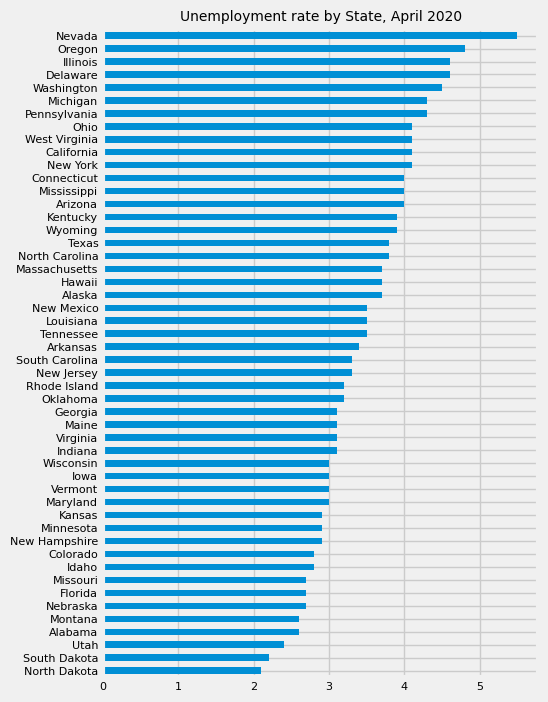

In [5]:
#T -> flips the whole dataset from rows to columns
Apr_2020 = unemp_states.loc[unemp_states.index == '2022-12-01'].T.sort_values('2022-12-01', ascending=True) \
            .plot(kind='barh', figsize=(5,8), fontsize = 8)
Apr_2020.legend().remove()
Apr_2020.set_title('Unemployment rate by State, April 2020', fontsize = 10)

### Plot the states with the largest unemployment rate for 2022 using Matplotlib

Text(0.5, 1.0, 'States with the largest unemployment rate in December 2022')

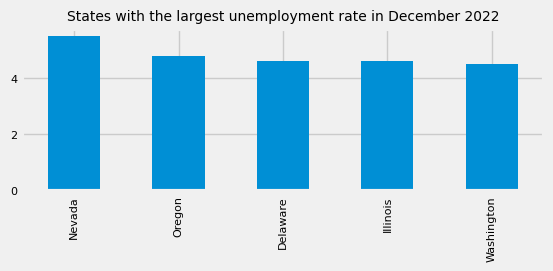

In [6]:
un_2022 = unemp_states.loc[unemp_states.index == '2022-12-01'].T.sort_values('2022-12-01', ascending=False).head(5) \
            .plot(kind='bar', figsize=(6,2), fontsize = 8)
un_2022.legend().remove()
un_2022.set_title('States with the largest unemployment rate in December 2022', fontsize = 10)

## FRED participation rate data for the 50 states

### Pulling each table straight from the FRED website, putting them into one big dataframe

In [7]:
part_df = fred.search('participation rate state', filter = ('frequency','Monthly'))
part_df = part_df.query("seasonal_adjustment == 'Seasonally Adjusted' and units == 'Percent'")
part_df = part_df.loc[part_df['title'].str.contains('Labor Force Participation Rate for')]
part_df = part_df.loc[part_df['title'].str.contains('District') == False]

part_id_to_state = part_df['title'].str.replace('Labor Force Participation Rate for ', '').to_dict()

part_all_results = []

for myid in part_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    part_all_results.append(results)

part_states = pd.concat(part_all_results, axis = 1)

#using list comprehension
part_states.columns = [part_id_to_state[c] for c in part_states.columns]

part_states = part_states.reindex(sorted(part_states.columns), axis=1)
#part_states.columns

### Plot the participation rate for the 50 states on an interactive line chart (1976-2022) using Plotly

In [8]:
part_rate = px.line(part_states, title = 'Participation rate by State \
(in % of of people in the work. age pop. that are in the lab. force), 1976-2022')

part_rate.update_layout(title={'y':0.9,'x':0.5}, xaxis_title="Year", yaxis_title="Participation rate", legend_title="US States")
part_rate

### Plot the unemployment rate and the participation rate for a given state using Matplotlib

Ohio


Text(0.5, 1.0, 'Unemployment and participation rate for Ohio (2020 and 2021)')

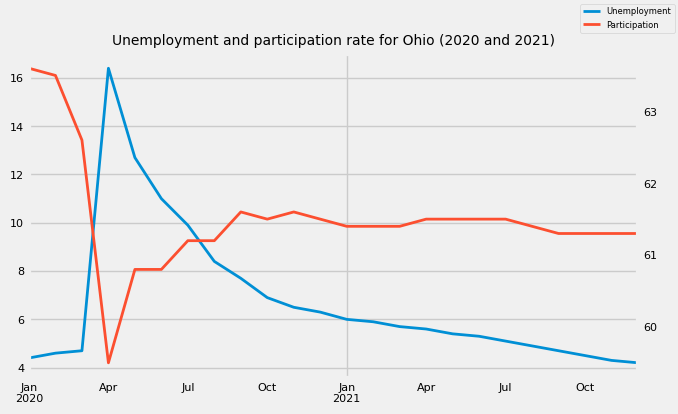

In [9]:
state = input()

Fig, ax = plt.subplots(figsize=(7,4))
ax2 = ax.twinx()
unemp_states.query('index >= 2020 and index < 2022')[state]\
.plot(ax=ax, label = 'Unemployment', fontsize = 8, lw=2)

part_states.query('index >= 2020 and index < 2022')[state]\
.plot(ax=ax2, label = 'Participation', color = color_pal[1], fontsize = 8, lw=2)

ax2.grid(False)
Fig.legend(fontsize = 6)
ax.set_title(f'Unemployment and participation rate for {state} (2020 and 2021)', fontsize = 10)

### Plot the unemployment rate and the participation rate for each state using Matplotlib

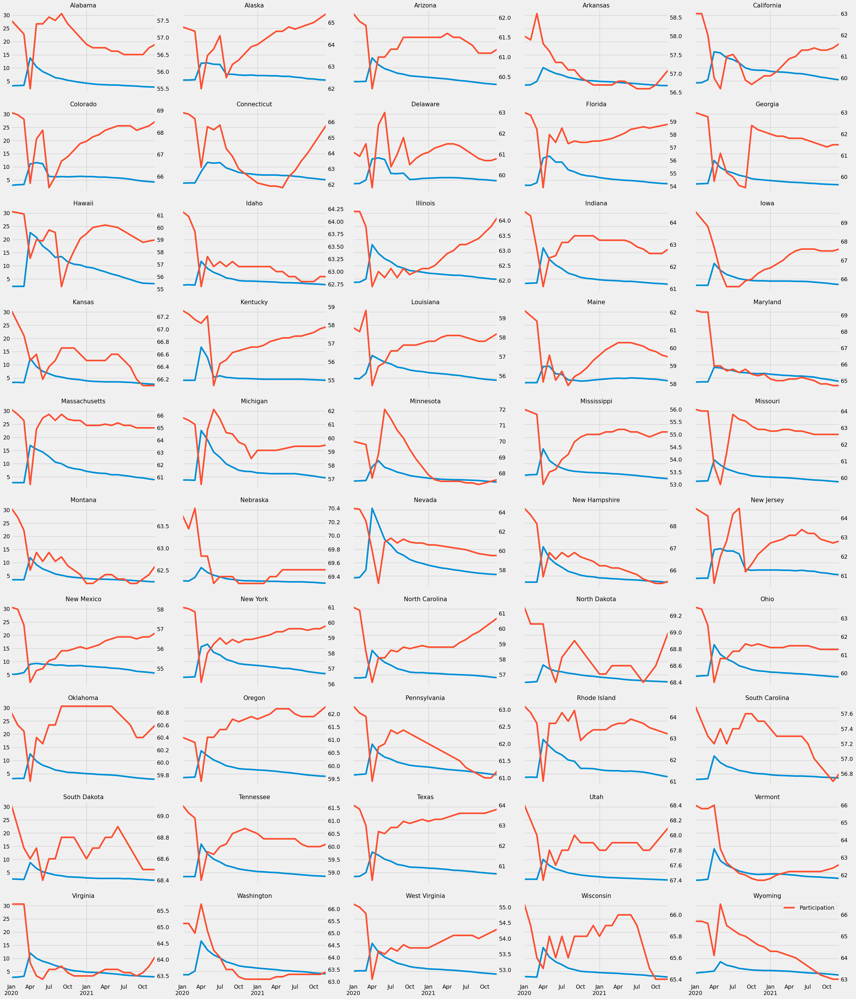

In [16]:
#Plot unemployment vs. participation
Fig, axs = plt.subplots(10,5, figsize=(30,35), sharex = True, sharey = True)
axs=axs.flatten()

i=0

for state in unemp_states.columns:
    ax2 = axs[i].twinx()
    unemp_states.query('index >= 2020 and index < 2022')[state].plot(ax=axs[i], label = 'Unemployment')
    part_states.query('index >= 2020 and index < 2022')[state].plot(ax=ax2, label = 'Participation', color = color_pal[1])
    ax2.grid(False)
    axs[i].set_title(state, fontsize = 15)
    i += 1

plt.tight_layout()
plt.legend()
plt.show()